# Explore the different cell types within the 15, 30, 40 and 50 um distances

In [13]:
from pathlib import Path
import scanpy as sc
import h5py
import numpy as np
import pandas as pd
import anndata as ad
import matplotlib.pyplot as plt
from anndata.io import read_elem

H5AD_PATH = Path(
    "/Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/"
    "AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/"
    "RESULTS/20240627__192310__KAECH_AD_GBM_240627/08_Plaque_Proximity_Analysis/"
    "adata_combined_with_alphashape_plaque_edge_15_20_30_40um.h5ad"
)

FIGURE_DIR = H5AD_PATH.parent / "figures"
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

# These barplots only need obs and the proximity metadata, so read just those
# elements rather than the whole 120 MB object. Swap in
#     adata = ad.read_h5ad(H5AD_PATH)
#     cell_metadata = adata.obs
#     proximity_information = adata.uns["plaque_proximity"]
# if you want the full object in memory for other work in this notebook.
with h5py.File(H5AD_PATH, "r") as handle:
    cell_metadata = read_elem(handle["obs"])
    adata = sc.read_h5ad(H5AD_PATH, backed="r")
    proximity_information = read_elem(handle["uns"]["plaque_proximity"])

print(cell_metadata.shape[0], "cells,", cell_metadata.shape[1], "obs columns")
print("Method:", proximity_information["method"])
print("Cut-offs:", proximity_information["cutoff_edges_um"], "µm")
print("Plaques:", int(proximity_information["n_plaques"]))
print(cell_metadata.columns.tolist())
print(adata.obsm_keys)
print(adata.obs["manual_celltype"].value_counts(dropna=False))


119794 cells, 52 obs columns
Method: signed euclidean distance to the alpha-shape plaque circumference
Cut-offs: [15. 20. 30. 40.] µm
Plaques: 583
['x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'Topic 1', 'Topic 2', 'Topic 3', 'Topic 4', 'Topic 5', 'Topic 6', 'Topic 7', 'Topic 8', 'Topic 9', 'Topic 10', 'Topic 11', 'Topic 12', 'Topic 13', 'Topic 14', 'Topic 15', 'topic', 'batch', '_scvi_batch', '_scvi_labels', 'leiden', 'manual_celltype', 'manual_celltype_with_cluster', 'plaque_edge_distance_um', 'nearest_plaque_id', 'inside_plaque', 'plaque_proximity_valid', 'plaque_edge_band_

## counts and composition

In [5]:
CELLTYPE_KEY = "manual_celltype_with_cluster"

# Cell types to leave out of the figures entirely.
DROP_CELLTYPES = ["unknown (REMOVE)"]

# False: cumulative ranges (<15, <20, <30, <40) - nested, each a superset.
# True:  exclusive ranges (<15, 15-20, 20-30, 30-40, >=40) - non-overlapping.
USE_EXCLUSIVE_RANGES = False

# Cut-offs come from the file, so the figures follow whatever was analysed.
BAND_EDGES_UM = [float(edge) for edge in proximity_information["cutoff_edges_um"]]

# Only cells that were actually scored against the IF plaque image: this drops
# the mock section and any infected cell whose coordinates fell off the image.
scored = cell_metadata["plaque_proximity_valid"].to_numpy().astype(bool)
cells = cell_metadata.loc[
    scored, [CELLTYPE_KEY, "plaque_edge_distance_um", "inside_plaque"]
].copy()
cells[CELLTYPE_KEY] = cells[CELLTYPE_KEY].astype(str)
cells = cells.loc[~cells[CELLTYPE_KEY].isin(DROP_CELLTYPES)]

distance_um = cells["plaque_edge_distance_um"].to_numpy()

# One boolean mask per range, plus an all-cells reference to compare against.
range_masks = {}
if USE_EXCLUSIVE_RANGES:
    for lower, upper in zip([-np.inf, *BAND_EDGES_UM], BAND_EDGES_UM):
        label = f"<{upper:g}" if np.isinf(lower) else f"{lower:g}-{upper:g}"
        range_masks[label] = (distance_um >= lower) & (distance_um < upper)
    range_masks[f">={BAND_EDGES_UM[-1]:g}"] = distance_um >= BAND_EDGES_UM[-1]
else:
    for upper in BAND_EDGES_UM:
        range_masks[f"<{upper:g}"] = distance_um < upper

REFERENCE_LABEL = "all scored cells"
range_masks[REFERENCE_LABEL] = np.ones(len(cells), dtype=bool)
range_labels = list(range_masks)

# Cell types ordered by overall abundance, so the bars read top-down.
celltype_order = cells[CELLTYPE_KEY].value_counts().index.tolist()

counts = pd.DataFrame(
    {
        label: cells.loc[mask, CELLTYPE_KEY].value_counts().reindex(celltype_order)
        for label, mask in range_masks.items()
    },
    index=celltype_order,
).fillna(0).astype(int)

# Composition: what share of the cells in this range is each cell type.
percent = 100 * counts.div(counts.sum(axis=0), axis=1)

print("Cells per range:")
print(counts.sum(axis=0).to_string())
print()
print("Cell counts by type and range")
display(counts)
print("Composition (% of the cells in each range)")
display(percent.round(2))


Cells per range:
<15                  3002
<20                  4186
<30                  6870
<40                  9944
all scored cells    55214

Cell counts by type and range


,<15,<20,<30,<40,all scored cells
1: Oligodendrocytes,366,561,1095,1640,11772
5: Cortical excitatory neurons,370,660,1280,2016,9156
3: Endothelial/Vasculature,380,533,837,1200,6608
2: Parenchymal astrocytes,228,352,656,1043,6518
4: Hypothalamic inhibitory neurons,131,223,437,698,5452
7: Microglia,1155,1268,1465,1681,4188
8: Thalamic excitatory neurons,87,136,236,369,2764
12: Striatal inhibitory neurons,41,80,187,310,2267
9: Dentate gyrus excitatory neurons,84,132,266,417,1668
11: OPCs,79,123,220,298,1621


Composition (% of the cells in each range)


,<15,<20,<30,<40,all scored cells
1: Oligodendrocytes,12.19,13.40,15.94,16.49,21.32
5: Cortical excitatory neurons,12.33,15.77,18.63,20.27,16.58
3: Endothelial/Vasculature,12.66,12.73,12.18,12.07,11.97
2: Parenchymal astrocytes,7.59,8.41,9.55,10.49,11.80
4: Hypothalamic inhibitory neurons,4.36,5.33,6.36,7.02,9.87
7: Microglia,38.47,30.29,21.32,16.90,7.59
8: Thalamic excitatory neurons,2.90,3.25,3.44,3.71,5.01
12: Striatal inhibitory neurons,1.37,1.91,2.72,3.12,4.11
9: Dentate gyrus excitatory neurons,2.80,3.15,3.87,4.19,3.02
11: OPCs,2.63,2.94,3.20,3.00,2.94


## The main barplot

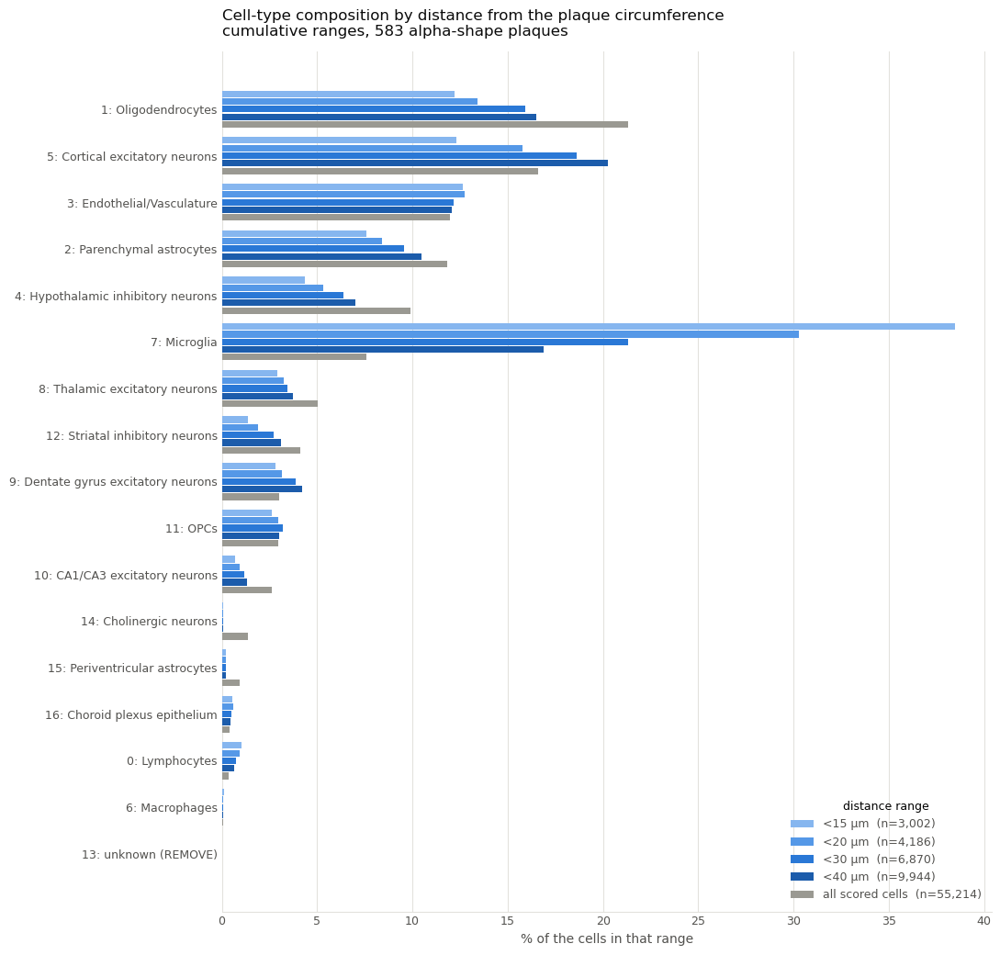

In [6]:
# Ordinal blue ramp: the ranges are ordered by distance, so one hue stepped
# light -> dark, not a categorical palette. The reference bar is neutral gray
# because it is a baseline, not another distance.
RANGE_COLORS = {
    label: color
    for label, color in zip(
        [label for label in range_labels if label != REFERENCE_LABEL],
        ["#86b6ef", "#5598e7", "#2a78d6", "#1c5cab", "#0d366b"],
    )
}
RANGE_COLORS[REFERENCE_LABEL] = "#9a9992"

TEXT_PRIMARY = "#0b0b0b"
TEXT_SECONDARY = "#52514e"
GRID_COLOR = "#e3e2dd"


def style_axis(ax, xlabel):
    """Recessive grid and axes; text wears ink, never the series colour."""
    ax.set_xlabel(xlabel, fontsize=10, color=TEXT_SECONDARY)
    ax.xaxis.grid(True, color=GRID_COLOR, linewidth=0.8)
    ax.set_axisbelow(True)
    ax.yaxis.grid(False)
    for side in ["top", "right", "left"]:
        ax.spines[side].set_visible(False)
    ax.spines["bottom"].set_color(GRID_COLOR)
    ax.tick_params(axis="both", colors=TEXT_SECONDARY, length=0, labelsize=9)


range_totals = counts.sum(axis=0)
bar_positions = np.arange(len(celltype_order))
group_height = 0.82 / len(range_labels)

fig, ax = plt.subplots(figsize=(11, 0.5 * len(celltype_order) + 2))

for position, label in enumerate(range_labels):
    offset = (position - (len(range_labels) - 1) / 2) * group_height
    # Range totals go in the legend, so no second panel is needed for them.
    suffix = f"  (n={range_totals[label]:,})"
    legend_label = (
        label + suffix if label == REFERENCE_LABEL else f"{label} µm" + suffix
    )
    ax.barh(
        bar_positions + offset,
        percent[label].to_numpy(),
        height=group_height * 0.86,   # leaves a surface gap between fills
        color=RANGE_COLORS[label],
        label=legend_label,
        zorder=3,
    )

ax.set_yticks(bar_positions)
ax.set_yticklabels(celltype_order, fontsize=9, color=TEXT_PRIMARY)
ax.invert_yaxis()
style_axis(ax, "% of the cells in that range")

range_kind = "exclusive" if USE_EXCLUSIVE_RANGES else "cumulative"
ax.set_title(
    "Cell-type composition by distance from the plaque circumference\n"
    f"{range_kind} ranges, {int(proximity_information['n_plaques'])} alpha-shape plaques",
    fontsize=12, color=TEXT_PRIMARY, loc="left", pad=12,
)
ax.legend(
    frameon=False, fontsize=9, labelcolor=TEXT_SECONDARY,
    loc="lower right", title="distance range", title_fontsize=9,
)

plt.tight_layout()
plt.savefig(
    FIGURE_DIR / "celltype_composition_by_plaque_distance.png",
    dpi=300, bbox_inches="tight", facecolor="white",
)
plt.show()


## Enrichment with confidence intervals

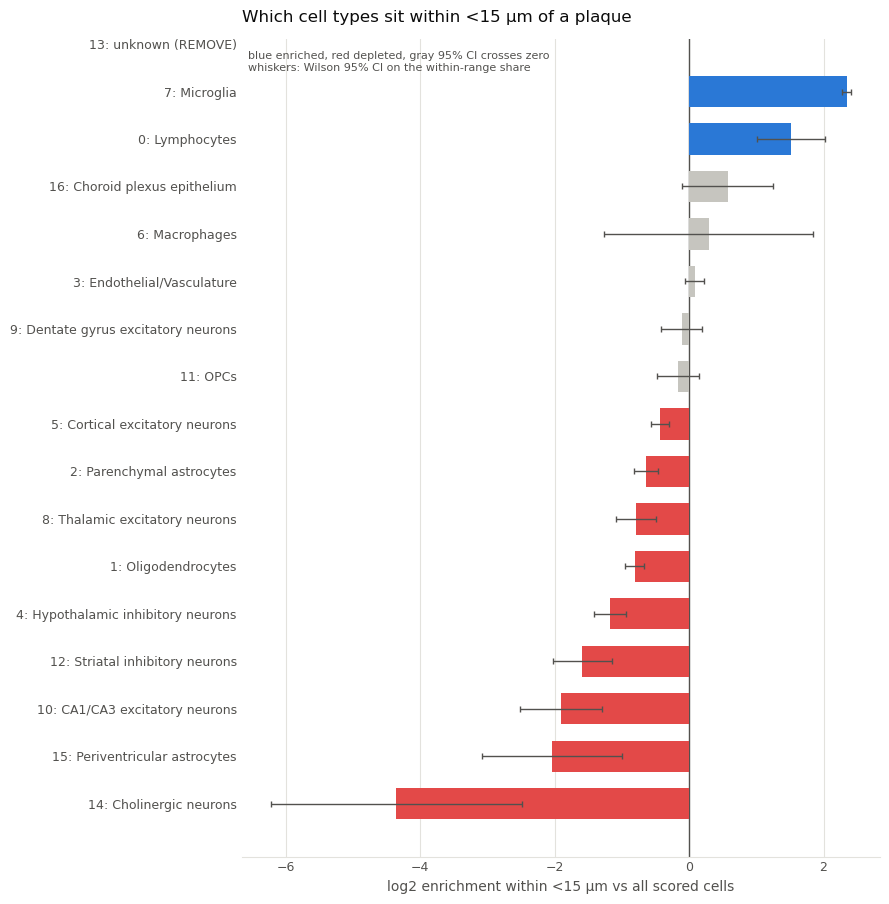

,cells_in_range,percent_in_range,percent_all_cells,log2_enrichment,log2_low,log2_high
14: Cholinergic neurons,2,0.067,1.364,-4.355,-6.222,-2.491
15: Periventricular astrocytes,7,0.233,0.958,-2.039,-3.084,-0.995
10: CA1/CA3 excitatory neurons,21,0.700,2.623,-1.906,-2.518,-1.297
12: Striatal inhibitory neurons,41,1.366,4.106,-1.588,-2.026,-1.152
4: Hypothalamic inhibitory neurons,131,4.364,9.874,-1.178,-1.420,-0.938
1: Oligodendrocytes,366,12.192,21.321,-0.806,-0.946,-0.669
8: Thalamic excitatory neurons,87,2.898,5.006,-0.789,-1.088,-0.491
2: Parenchymal astrocytes,228,7.595,11.805,-0.636,-0.817,-0.457
5: Cortical excitatory neurons,370,12.325,16.583,-0.428,-0.567,-0.291
11: OPCs,79,2.632,2.936,-0.158,-0.472,0.154


In [7]:
# Enrichment: is a cell type over- or under-represented close to plaques,
# relative to its share of all scored cells? That is a polarity question, so a
# diverging pair (blue / red) around a neutral zero.
ENRICHMENT_RANGE = list(range_masks)[0]

baseline_fraction = counts[REFERENCE_LABEL] / counts[REFERENCE_LABEL].sum()
range_fraction = counts[ENRICHMENT_RANGE] / counts[ENRICHMENT_RANGE].sum()

enrichment = pd.DataFrame(
    {
        "cells_in_range": counts[ENRICHMENT_RANGE],
        "percent_in_range": 100 * range_fraction,
        "percent_all_cells": 100 * baseline_fraction,
    }
)
enrichment["log2_enrichment"] = np.log2(
    range_fraction.replace(0, np.nan) / baseline_fraction
)

# Wilson 95% interval on the within-range share, mapped onto the ratio. The
# baseline is treated as fixed because it comes from far more cells.
range_total = int(counts[ENRICHMENT_RANGE].sum())
z = 1.959964
observed = range_fraction.to_numpy()
denominator = 1 + z**2 / range_total
center = (observed + z**2 / (2 * range_total)) / denominator
half_width = (
    z * np.sqrt(observed * (1 - observed) / range_total + z**2 / (4 * range_total**2))
) / denominator
enrichment["log2_low"] = np.log2(
    np.clip(center - half_width, 1e-9, None) / baseline_fraction
)
enrichment["log2_high"] = np.log2(
    np.clip(center + half_width, 1e-9, None) / baseline_fraction
)

enrichment = enrichment.sort_values("log2_enrichment")
interval_excludes_zero = (enrichment["log2_low"] > 0) | (enrichment["log2_high"] < 0)

POSITIVE_COLOR = "#2a78d6"
NEGATIVE_COLOR = "#e34948"
NEUTRAL_COLOR = "#c6c5bf"

bar_colors = [
    (POSITIVE_COLOR if value > 0 else NEGATIVE_COLOR) if excludes_zero else NEUTRAL_COLOR
    for value, excludes_zero in zip(
        enrichment["log2_enrichment"], interval_excludes_zero
    )
]

fig, ax = plt.subplots(figsize=(9, 0.42 * len(enrichment) + 2))
positions = np.arange(len(enrichment))

ax.barh(positions, enrichment["log2_enrichment"], height=0.66, color=bar_colors, zorder=3)
ax.errorbar(
    enrichment["log2_enrichment"],
    positions,
    xerr=[
        enrichment["log2_enrichment"] - enrichment["log2_low"],
        enrichment["log2_high"] - enrichment["log2_enrichment"],
    ],
    fmt="none", ecolor=TEXT_SECONDARY, elinewidth=1, capsize=2.5, zorder=4,
)
ax.axvline(0, color=TEXT_SECONDARY, linewidth=1, zorder=2)

ax.set_yticks(positions)
ax.set_yticklabels(enrichment.index, fontsize=9, color=TEXT_PRIMARY)
style_axis(ax, f"log2 enrichment within {ENRICHMENT_RANGE} µm vs all scored cells")
ax.set_title(
    f"Which cell types sit within {ENRICHMENT_RANGE} µm of a plaque",
    fontsize=12, color=TEXT_PRIMARY, loc="left", pad=12,
)
ax.text(
    0.01, 0.985,
    "blue enriched, red depleted, gray 95% CI crosses zero\n"
    "whiskers: Wilson 95% CI on the within-range share",
    transform=ax.transAxes, ha="left", va="top", fontsize=8, color=TEXT_SECONDARY,
)

plt.tight_layout()
plt.savefig(
    FIGURE_DIR / "celltype_enrichment_near_plaques.png",
    dpi=300, bbox_inches="tight", facecolor="white",
)
plt.show()

display(enrichment.round(3))


## Composition trend across ranges

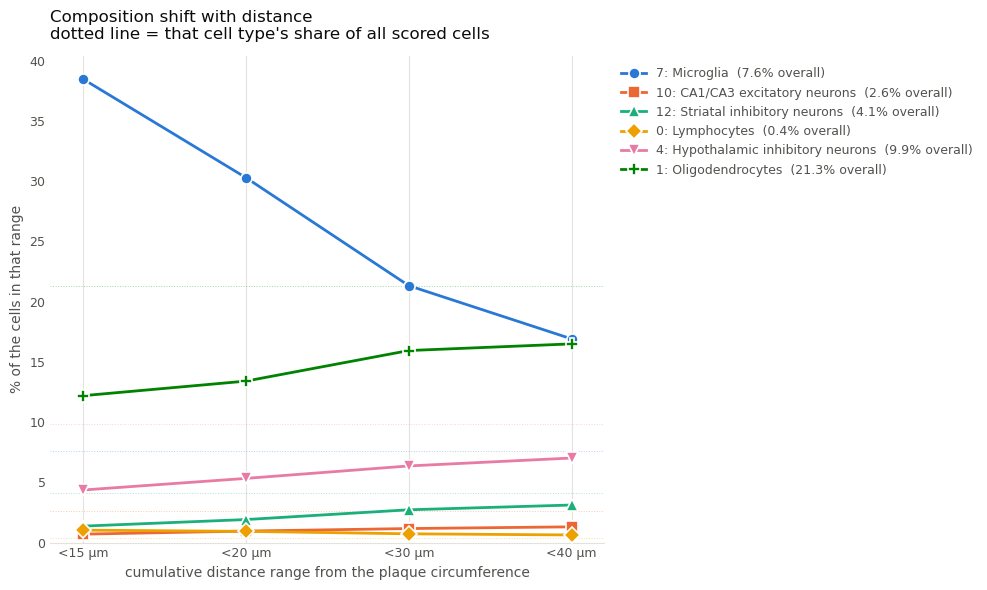

In [8]:
# One line per cell type reads the distance trend more directly than 16 groups
# of bars. Show the cell types that actually shift, not just the abundant ones,
# and only those with enough cells in the widest range to be stable.
MINIMUM_CELLS_FOR_TREND = 50
N_TREND_CELLTYPES = 6

plotted_range_labels = [label for label in range_labels if label != REFERENCE_LABEL]

shift_vs_baseline = (
    percent[plotted_range_labels[0]] / percent[REFERENCE_LABEL].replace(0, np.nan)
).apply(np.log2).abs()
eligible = counts[plotted_range_labels[-1]] >= MINIMUM_CELLS_FOR_TREND
trend_celltypes = (
    shift_vs_baseline.loc[eligible]
    .sort_values(ascending=False)
    .head(N_TREND_CELLTYPES)
    .index.tolist()
)

# Categorical hues in the documented fixed order, plus a marker per series so
# identity never rests on colour alone where lines cross.
LINE_COLORS = ["#2a78d6", "#eb6834", "#1baf7a", "#eda100", "#e87ba4", "#008300"]
LINE_MARKERS = ["o", "s", "^", "D", "v", "P"]

fig, ax = plt.subplots(figsize=(10, 6))
x_positions = np.arange(len(plotted_range_labels))

for celltype, color, marker in zip(trend_celltypes, LINE_COLORS, LINE_MARKERS):
    values = percent.loc[celltype, plotted_range_labels].to_numpy()
    baseline = percent.loc[celltype, REFERENCE_LABEL]
    ax.axhline(baseline, color=color, linewidth=0.7, linestyle=":", alpha=0.35, zorder=1)
    ax.plot(
        x_positions, values, marker=marker, markersize=8, linewidth=2, color=color,
        markeredgecolor="white", markeredgewidth=1.2,
        label=f"{celltype}  ({baseline:.1f}% overall)", zorder=3,
    )

ax.set_xticks(x_positions)
ax.set_xticklabels([f"{label} µm" for label in plotted_range_labels], fontsize=9)
style_axis(
    ax,
    ("exclusive" if USE_EXCLUSIVE_RANGES else "cumulative")
    + " distance range from the plaque circumference",
)
ax.set_ylabel("% of the cells in that range", fontsize=10, color=TEXT_SECONDARY)
ax.set_title(
    "Composition shift with distance\n"
    "dotted line = that cell type's share of all scored cells",
    fontsize=12, color=TEXT_PRIMARY, loc="left", pad=12,
)
ax.legend(
    frameon=False, fontsize=9, labelcolor=TEXT_SECONDARY,
    bbox_to_anchor=(1.01, 1), loc="upper left",
)
ax.set_xlim(-0.2, len(plotted_range_labels) - 0.8)
ax.set_ylim(0, None)

plt.tight_layout()
plt.savefig(
    FIGURE_DIR / "celltype_composition_trend.png",
    dpi=300, bbox_inches="tight", facecolor="white",
)
plt.show()


### Subcluster Lymphocytes

/opt/anaconda3/envs/scvi_mac/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


PCA on 429 cells x 480 genes
variance explained by first 10 PCs: [0.0889 0.0545 0.0334 0.0229 0.0203 0.0147 0.0123 0.0121 0.011  0.0105]
cumulative at 30 PCs: 0.281

Leiden resolution 0.1: 2 subclusters
lymphocyte_leiden
0    244
1    185


batch,AD_inf,AD_mock,total,percent_infected
lymphocyte_leiden,,,,
0,132,112,244,54.1
1,69,116,185,37.3


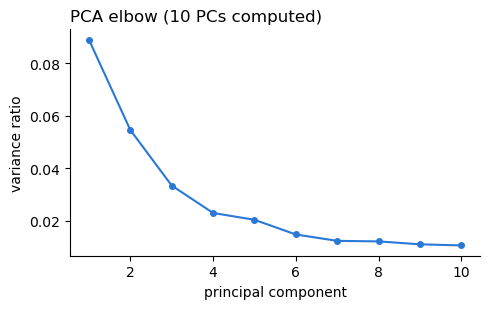

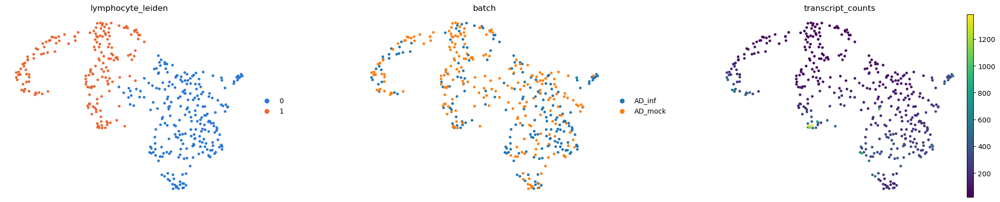

In [16]:
# Fresh PCA -> UMAP -> Leiden on the lymphocytes only.
LEIDEN_RESOLUTION = 0.1
LEIDEN_KEY = "lymphocyte_leiden"
N_PCS = 10
N_NEIGHBORS = 10
adata = ad.read_h5ad(H5AD_PATH)
lymphocytes = adata[adata.obs["manual_celltype"].isin(["Lymphocytes"])].copy()
# X is log1p-normalised. Keep a copy before scaling: PCA wants scaled data,
# but the feature and violin plots must show log-normalised expression, not
# z-scores, or the colour bars and violin axes are meaningless.
lymphocytes.layers["lognorm"] = lymphocytes.X.copy()

# All 480 panel genes are used. The panel is already a targeted gene set, so
# HVG selection on 429 cells mostly just discards signal; set USE_HVG = True
# if you want the standard step anyway.
USE_HVG = False
if USE_HVG:
    sc.pp.highly_variable_genes(lymphocytes, n_top_genes=300)
    print("HVGs:", int(lymphocytes.var["highly_variable"].sum()))

sc.pp.scale(lymphocytes, max_value=10)
sc.tl.pca(lymphocytes, n_comps=N_PCS, svd_solver="arpack", random_state=0)

# Put log-normalised values back for every downstream plot.
lymphocytes.X = lymphocytes.layers["lognorm"].copy()

variance_ratio = lymphocytes.uns["pca"]["variance_ratio"]
print(f"PCA on {lymphocytes.n_obs} cells x {lymphocytes.n_vars} genes")
print("variance explained by first 10 PCs:", np.round(variance_ratio[:10], 4))
print("cumulative at 30 PCs:", round(float(variance_ratio.sum()), 3))

sc.pp.neighbors(lymphocytes, n_pcs=N_PCS, n_neighbors=N_NEIGHBORS)
sc.tl.umap(lymphocytes, min_dist=0.3, random_state=0)
sc.tl.leiden(
    lymphocytes, resolution=LEIDEN_RESOLUTION, key_added=LEIDEN_KEY,
    flavor="igraph", n_iterations=2, directed=False, random_state=0,
)

cluster_sizes = lymphocytes.obs[LEIDEN_KEY].value_counts().sort_index()
print()
print(f"Leiden resolution {LEIDEN_RESOLUTION}: "
      f"{lymphocytes.obs[LEIDEN_KEY].nunique()} subclusters")
print(cluster_sizes.to_string())

cluster_composition = pd.crosstab(lymphocytes.obs[LEIDEN_KEY], lymphocytes.obs["batch"])
cluster_composition["total"] = cluster_composition.sum(axis=1)
cluster_composition["percent_infected"] = (
    100 * cluster_composition.get("AD_inf", 0) / cluster_composition["total"]
)
display(cluster_composition.round(1))

CLUSTER_COLORS = ["#2a78d6", "#eb6834", "#1baf7a", "#eda100",
                  "#e87ba4", "#008300", "#4a3aa7", "#e34948"]
lymphocytes.uns[f"{LEIDEN_KEY}_colors"] = CLUSTER_COLORS[
    : lymphocytes.obs[LEIDEN_KEY].nunique()
]

# Elbow plus the clusters and batch on the same UMAP. PCA on the subset drops
# the scVI batch correction, so check the batch panel: if the clusters line up
# with batch rather than with markers, that is the batch effect, not biology.
fig, ax = plt.subplots(figsize=(5, 3.2))
ax.plot(range(1, len(variance_ratio) + 1), variance_ratio, marker="o",
        markersize=4, color="#2a78d6")
ax.set_xlabel("principal component")
ax.set_ylabel("variance ratio")
ax.set_title(f"PCA elbow ({N_PCS} PCs computed)", loc="left")
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.savefig(FIGURE_DIR / "pca_elbow.png", dpi=300, bbox_inches="tight", facecolor="white")
plt.show()

fig = sc.pl.umap(
    lymphocytes, color=[LEIDEN_KEY, "batch", "transcript_counts"], ncols=3,
    wspace=0.3, frameon=False, size=60, return_fig=True,
)
fig.savefig(FIGURE_DIR / "pca_umap_clusters.png", dpi=300,
            bbox_inches="tight", facecolor="white")
plt.show()


In [17]:
# What separates the subclusters, so the feature and violin plots can be read.
sc.tl.rank_genes_groups(
    lymphocytes, groupby=LEIDEN_KEY, method="wilcoxon", tie_correct=True,
)

marker_table = sc.get.rank_genes_groups_df(lymphocytes, group=None)
marker_table = marker_table.rename(columns={"group": "subcluster"})
significant_markers = marker_table.loc[
    (marker_table["pvals_adj"] < 0.05) & (marker_table["logfoldchanges"] > 0.5)
]

print("Significant up-markers per subcluster (padj < 0.05, logFC > 0.5):")
print(significant_markers["subcluster"].value_counts().sort_index().to_string())
print()
for cluster_name in lymphocytes.obs[LEIDEN_KEY].cat.categories:
    top = significant_markers.loc[significant_markers["subcluster"] == cluster_name].head(12)
    print(f"cluster {cluster_name}: " + ", ".join(top["names"]))

print()
print("Detection depth per subcluster:")
display(
    lymphocytes.obs.groupby(LEIDEN_KEY, observed=True)[
        ["transcript_counts", "n_genes_by_counts", "cell_area"]
    ].median().round(1)
)

print("Top 10 per subcluster:")
display(
    significant_markers.groupby("subcluster", observed=True)
    .head(10)[["subcluster", "names", "logfoldchanges", "pvals_adj"]]
    .round(4)
)


Significant up-markers per subcluster (padj < 0.05, logFC > 0.5):
subcluster
0    129
1     41

cluster 0: Trbc1, Cd3e, Ccl5, Cxcr3, B2m, Itgb2, Il7r, Cxcr6, Cd8a, Il2rb, Cd8b1, Itgal
cluster 1: Chgb, Ighd, Ms4a1, Cx3cl1, Tubb3, Dclk1, Cd19, Cd74, H2-Ab1, Chga, Cd55, Ighm

Detection depth per subcluster:


/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:380: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
/opt/anaconda3/envs/scvi_mac/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:380: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (


,transcript_counts,n_genes_by_counts,cell_area
lymphocyte_leiden,,,
0,206.5,90.0,62.3
1,83.0,53.0,70.3


Top 10 per subcluster:


,subcluster,names,logfoldchanges,pvals_adj
0,0,Trbc1,3.3739,0.0
1,0,Cd3e,3.7107,0.0
2,0,Ccl5,3.5742,0.0
3,0,Cxcr3,4.2336,0.0
4,0,B2m,1.6049,0.0
5,0,Itgb2,2.5044,0.0
6,0,Il7r,3.8530,0.0
7,0,Cxcr6,3.4257,0.0
8,0,Cd8a,3.4979,0.0
9,0,Il2rb,3.9333,0.0


In [20]:
from pathlib import Path
import pandas as pd

MARKER_XLSX_PATH = Path(
    "/Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/"
    "Gene List of sub-clustering/BRAIN_CLUSTERING_GUIDE_IRENE_Vs.xlsx"
)
MARKER_SHEET = "cd8_subclustering_long"
MINIMUM_GENES_PER_SIGNATURE = 2

# Intersect against whichever object is loaded.
panel_genes = set(
    lymphocytes.var_names if "lymphocytes" in dir() else adata.var_names
)

marker_sheet = pd.read_excel(MARKER_XLSX_PATH, sheet_name=MARKER_SHEET)
marker_sheet = marker_sheet.rename(columns={"Unnamed: 2": "note"})
marker_sheet["Gene"] = marker_sheet["Gene"].astype(str).str.strip()
marker_sheet["Phenotype"] = marker_sheet["Phenotype"].astype(str).str.strip()

# The sheet marks a few Trm genes as "down"; those must not be scored as if
# high expression supported the phenotype.
down_genes = marker_sheet["note"].astype(str).str.lower().eq("down")
marker_sheet = marker_sheet.loc[~down_genes]

marker_sheet["in_panel"] = marker_sheet["Gene"].isin(panel_genes)

# Deduplicate: some genes are listed twice within a phenotype.
signature_genes = {
    phenotype: sorted(set(group.loc[group["in_panel"], "Gene"]))
    for phenotype, group in marker_sheet.groupby("Phenotype", sort=False)
}

coverage = pd.DataFrame(
    {
        "genes_in_sheet": marker_sheet.groupby("Phenotype", sort=False)["Gene"].nunique(),
        "genes_in_panel": {k: len(v) for k, v in signature_genes.items()},
    }
)
coverage["genes"] = [", ".join(signature_genes[p]) for p in coverage.index]
coverage["scored"] = coverage["genes_in_panel"] >= MINIMUM_GENES_PER_SIGNATURE

SCORED_SIGNATURES = {
    phenotype: genes
    for phenotype, genes in signature_genes.items()
    if len(genes) >= MINIMUM_GENES_PER_SIGNATURE
}

# Every sheet gene that exists on the panel.
ALL_MARKER_GENES = sorted(set(marker_sheet.loc[marker_sheet["in_panel"], "Gene"]))

print(f"Sheet: {marker_sheet['Gene'].nunique()} unique genes, "
      f"{len(ALL_MARKER_GENES)} on the {len(panel_genes)}-gene panel.")
print(f"Signatures with >= {MINIMUM_GENES_PER_SIGNATURE} panel genes: "
      f"{len(SCORED_SIGNATURES)} of {len(signature_genes)}")
display(coverage.sort_values("genes_in_panel", ascending=False))


Sheet: 126 unique genes, 75 on the 480-gene panel.
Signatures with >= 2 panel genes: 16 of 23


,genes_in_sheet,genes_in_panel,genes,scored
Exhausted CD8 T Cells,17,12,"Cd101, Cd38, Ctla4, Entpd1, Eomes, Havcr2, Il1...",True
Transcription Factors,13,9,"Batf, Eomes, Id2, Id3, Ikzf2, Prdm1, Tbx21, To...",True
Effector CD8 T Cells,10,9,"Ccl4, Ccl5, Fasl, Gzma, Gzmb, Gzmk, Ifng, Prf1...",True
Circulating,8,7,"Cx3cr1, Cxcr6, Id2, Klf2, Klrg1, S1pr5, Zeb2",True
Tissue-Resident Memory (Trm),12,7,"Cd69, Cxcr3, Cxcr6, Itgae, Runx3, Vim, Zfp683",True
IFN-Responsive CD8 T Cells,6,4,"Cxcl10, Ifngr1, Irf7, Isg15",True
Dendritic Cells,5,4,"Ccr7, Cd80, Itgam, Itgax",True
Metabolic shift / stress,4,4,"Atf3, Hk2, Junb, Ldha",True
Cytokine receptors,6,4,"Ifnar1, Ifnar2, Il18r1, Il2rb",True
Apoptosis / terminally differentiated,7,4,"Fas, Id2, Tnf, Zeb2",True


72 of 75 sheet genes detected in >= 5 of the 429 lymphocytes.

Not plotted (too sparse):
Cd80    4
Fos     2
Il10    0


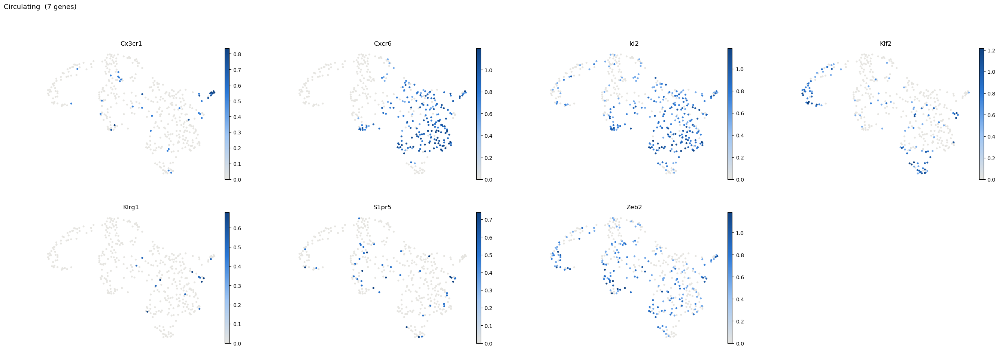

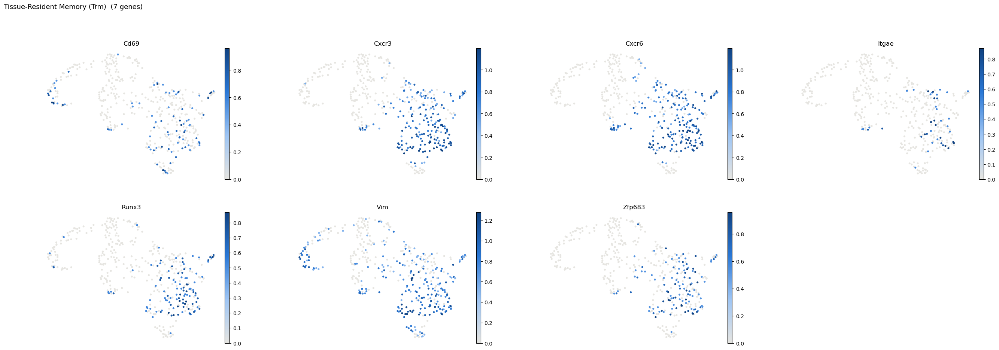

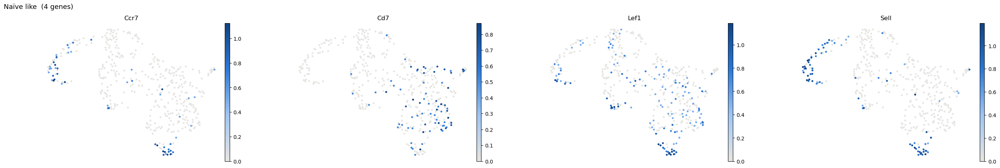

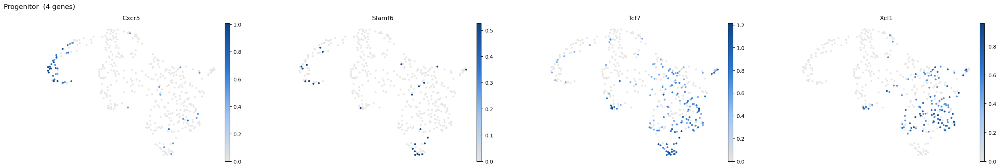

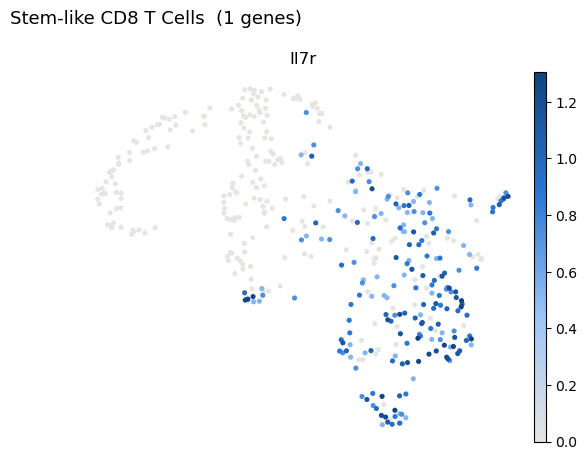

...

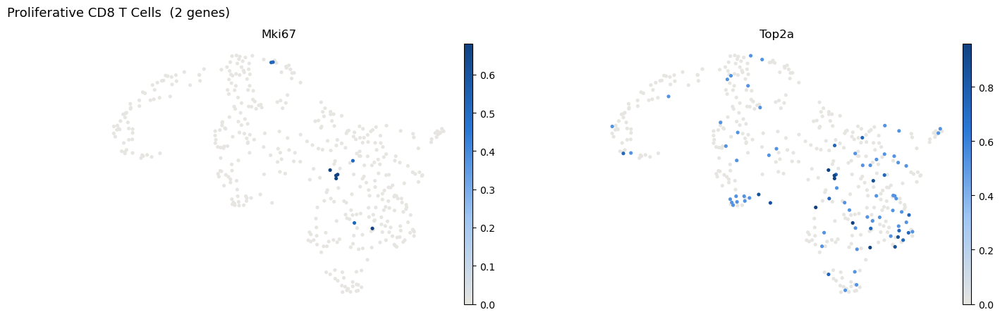

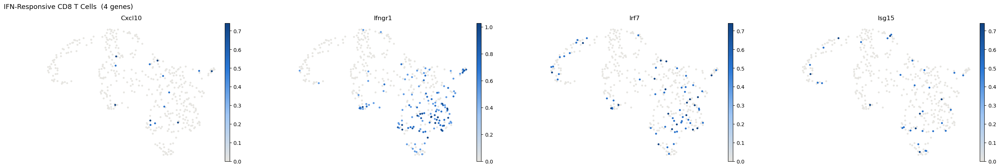

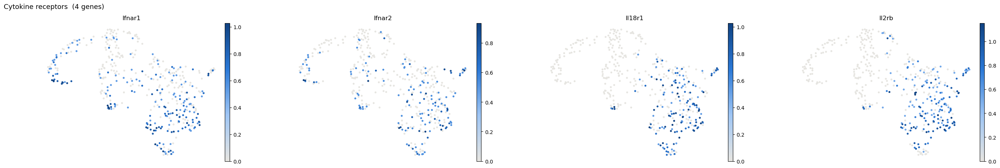

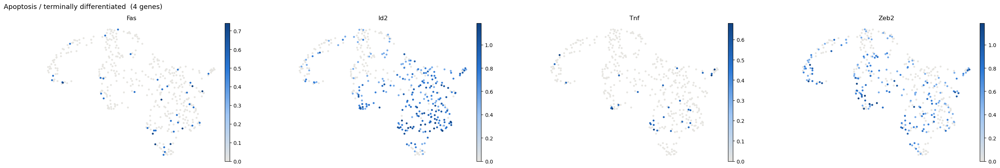

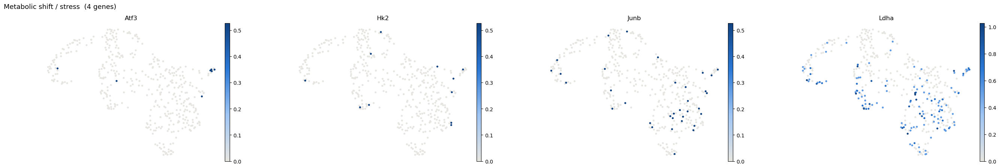

skipped feature plot for 'Macrophages (meninges)': no gene detected often enough


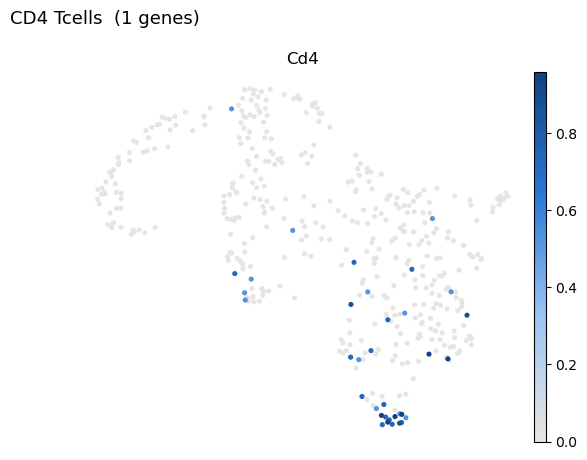

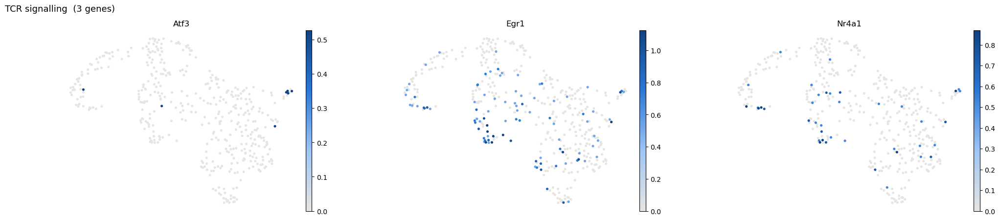

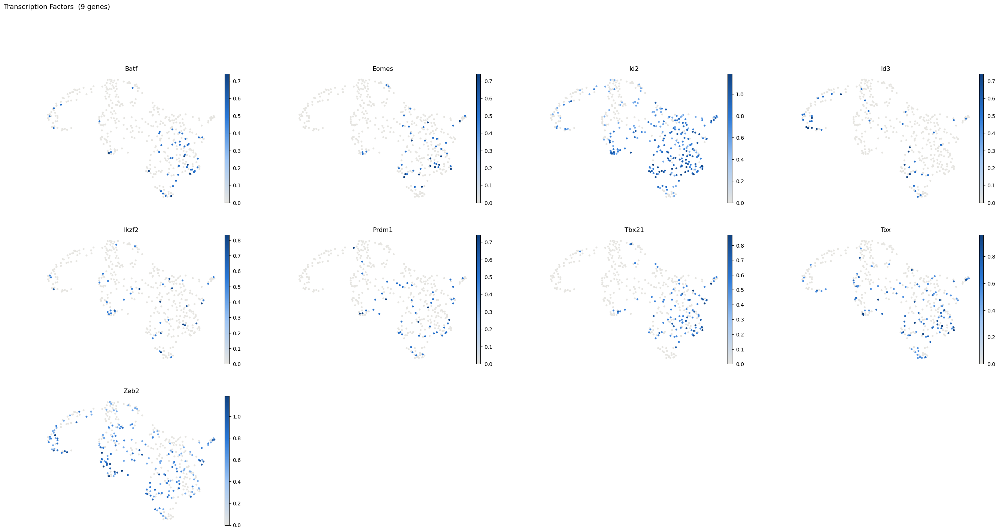

skipped feature plot for 'Innate-like CD8': no gene detected often enough


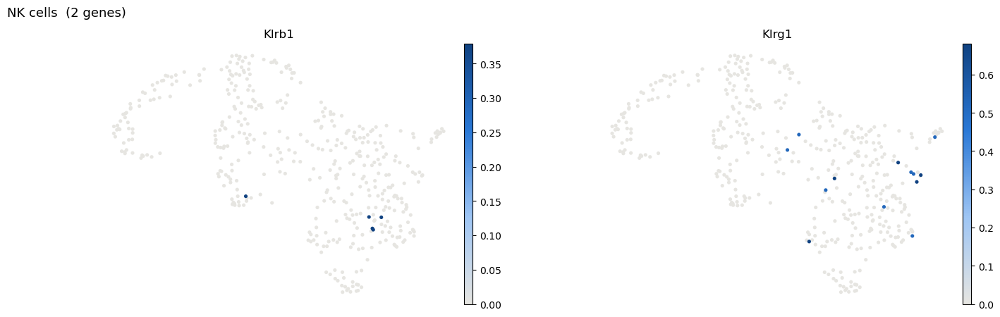

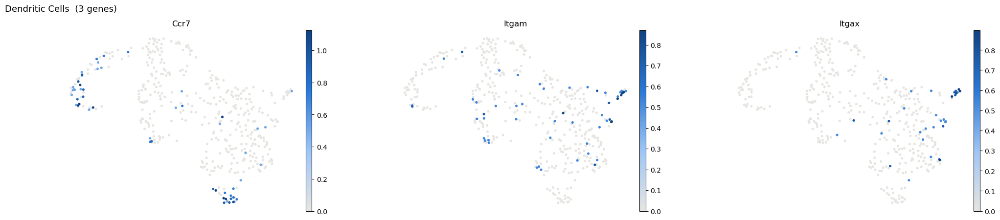

skipped feature plot for 'Treg precusor': no gene detected often enough


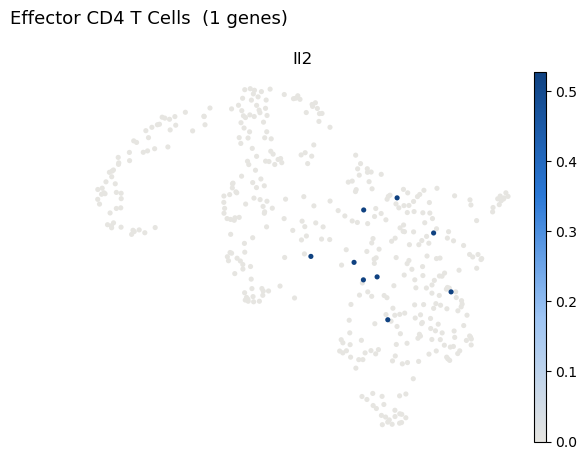

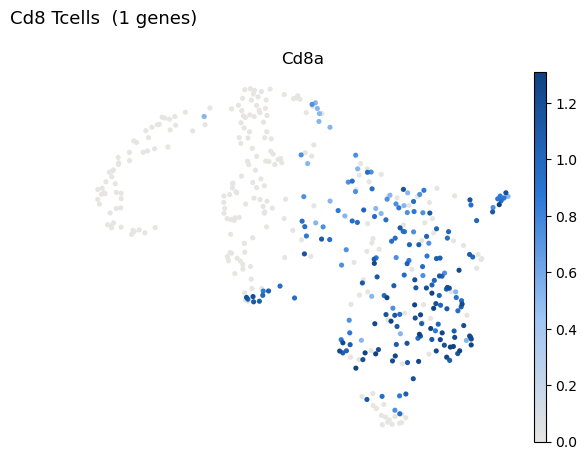

Feature plots written to: /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/08_Plaque_Proximity_Analysis/figures/feature_plots


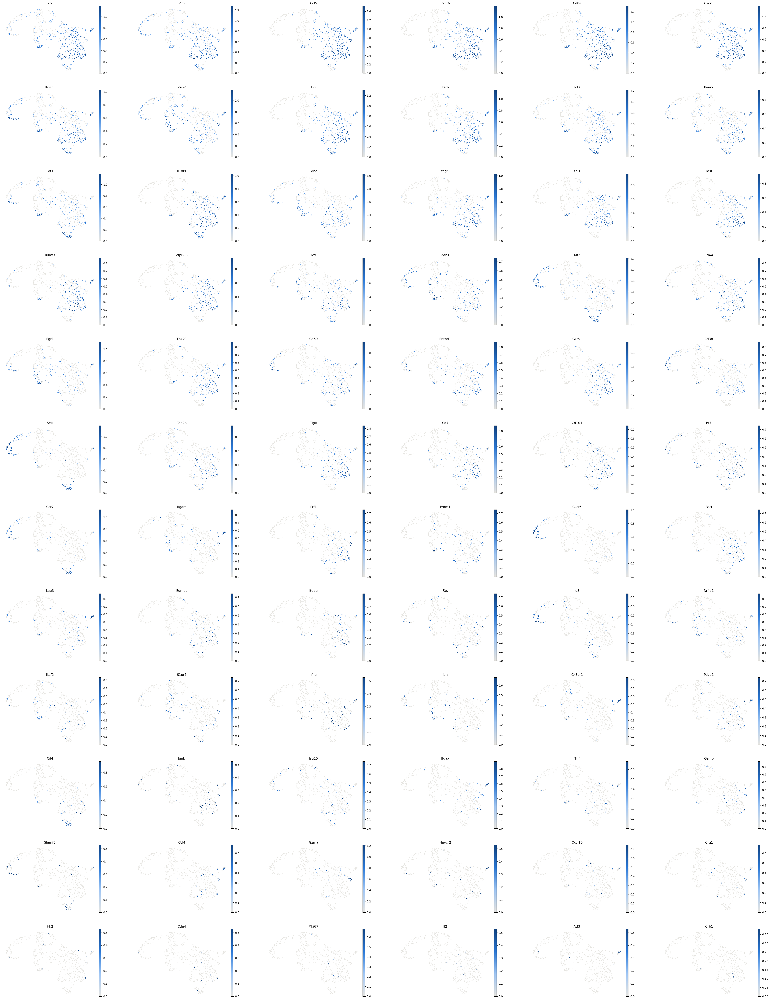

In [21]:
from matplotlib.colors import LinearSegmentedColormap

FEATURE_DIR = FIGURE_DIR / "feature_plots"
FEATURE_DIR.mkdir(parents=True, exist_ok=True)

# A gene detected in a handful of cells produces a panel of noise, so drop
# those rather than plotting them. Set to 0 to keep everything.
MINIMUM_CELLS_DETECTED = 5

expression_matrix = lymphocytes[:, ALL_MARKER_GENES].X
expression_matrix = (
    expression_matrix.toarray() if hasattr(expression_matrix, "toarray") else expression_matrix
)
cells_detected = pd.Series(
    (expression_matrix > 0).sum(axis=0), index=ALL_MARKER_GENES, name="cells_detected"
).sort_values(ascending=False)

PLOTTED_GENES = cells_detected.loc[cells_detected >= MINIMUM_CELLS_DETECTED].index.tolist()
dropped_genes = cells_detected.loc[cells_detected < MINIMUM_CELLS_DETECTED]

print(f"{len(PLOTTED_GENES)} of {len(ALL_MARKER_GENES)} sheet genes detected in "
      f">= {MINIMUM_CELLS_DETECTED} of the {lymphocytes.n_obs} lymphocytes.")
print()
print("Not plotted (too sparse):")
print(dropped_genes.to_string())

# scanpy's default puts zero at white, which erases the UMAP outline and leaves
# only the expressing cells visible. Starting the ramp at light gray keeps the
# non-expressing cells on screen as context.
EXPRESSION_CMAP = LinearSegmentedColormap.from_list(
    "gray_to_blue", ["#e6e5e1", "#9ec5f4", "#2a78d6", "#104281"]
)


def safe_filename(name):
    for character in " /()":
        name = name.replace(character, "_")
    return name.replace("__", "_").strip("_")


# One figure per phenotype, so each set can be read on its own.
for phenotype, genes in signature_genes.items():
    plot_genes = [gene for gene in genes if gene in PLOTTED_GENES]
    if not plot_genes:
        print(f"skipped feature plot for {phenotype!r}: no gene detected often enough")
        continue

    fig = sc.pl.umap(
        lymphocytes, color=plot_genes, ncols=4, frameon=False, size=55,
        cmap=EXPRESSION_CMAP, vmin=0, vmax="p99", wspace=0.25, return_fig=True,
    )
    fig.suptitle(f"{phenotype}  ({len(plot_genes)} genes)", y=1.01,
                 fontsize=13, x=0.02, ha="left")
    fig.savefig(FEATURE_DIR / f"umap_{safe_filename(phenotype)}.png", dpi=200,
                bbox_inches="tight", facecolor="white")
    plt.show()

print("Feature plots written to:", FEATURE_DIR)

# And one combined grid of every plotted gene, as an overview.
fig = sc.pl.umap(
    lymphocytes, color=PLOTTED_GENES, ncols=6, frameon=False, size=40,
    cmap=EXPRESSION_CMAP, vmin=0, vmax="p99", wspace=0.25, return_fig=True,
)
fig.savefig(FIGURE_DIR / "umap_all_sheet_genes.png", dpi=150,
            bbox_inches="tight", facecolor="white")
plt.show()


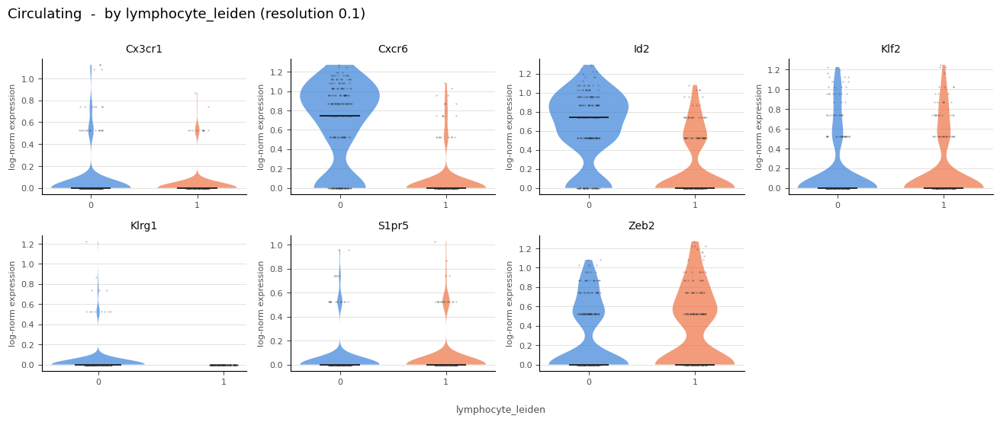

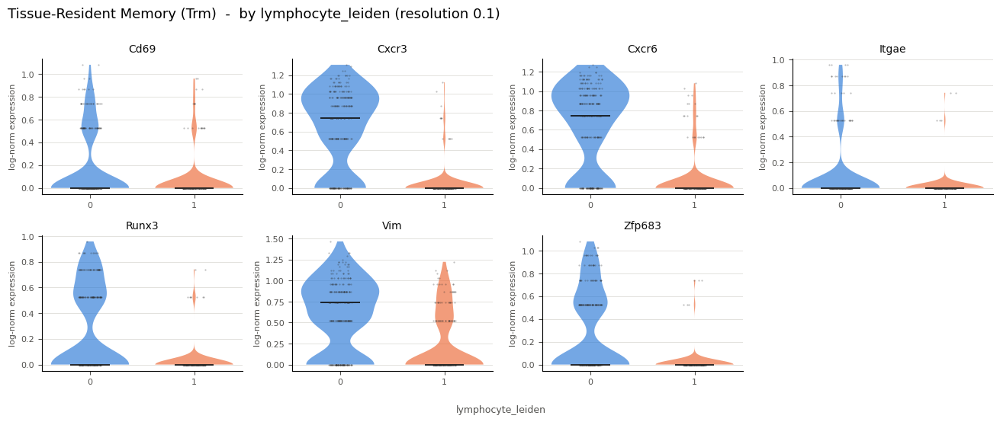

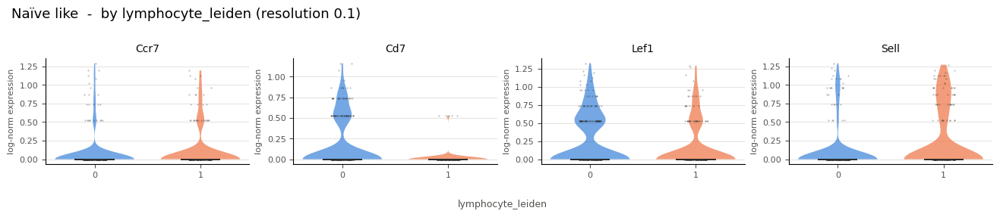

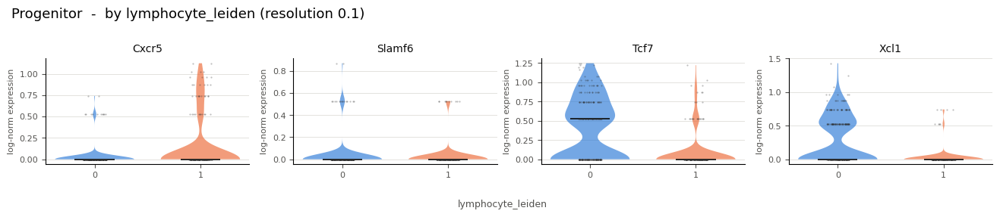

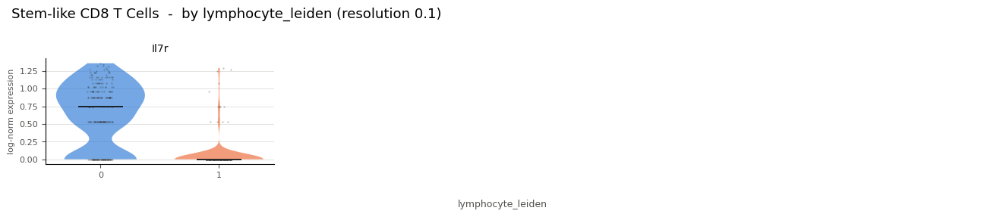

...

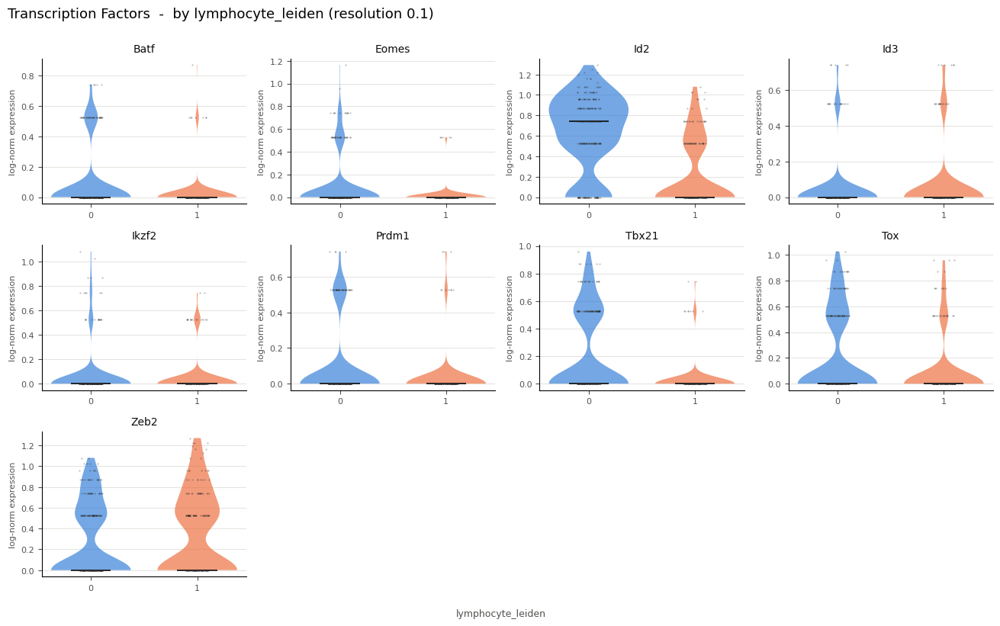

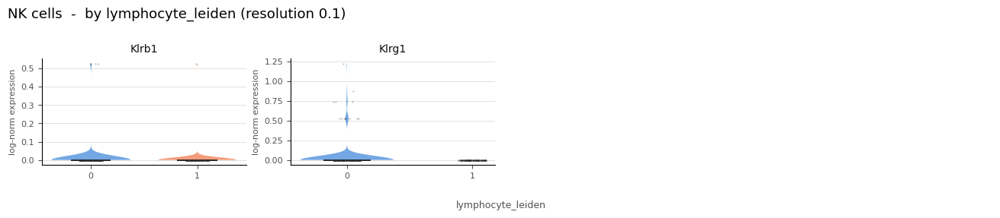

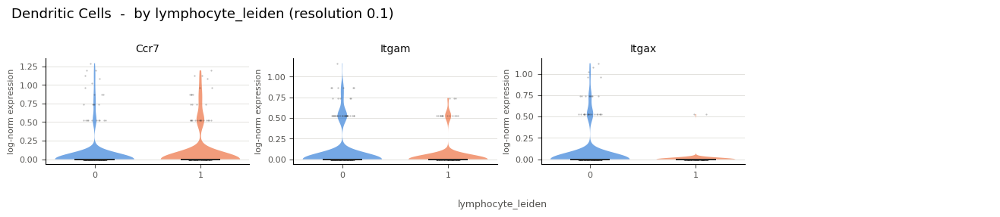

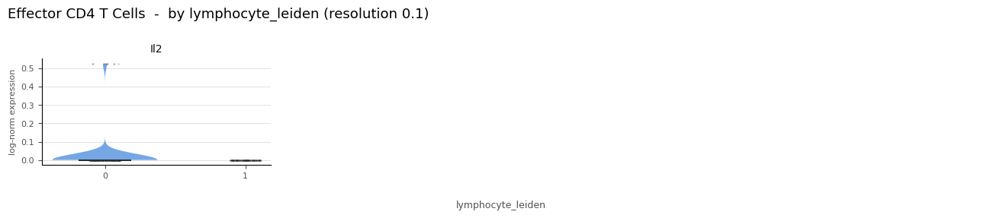

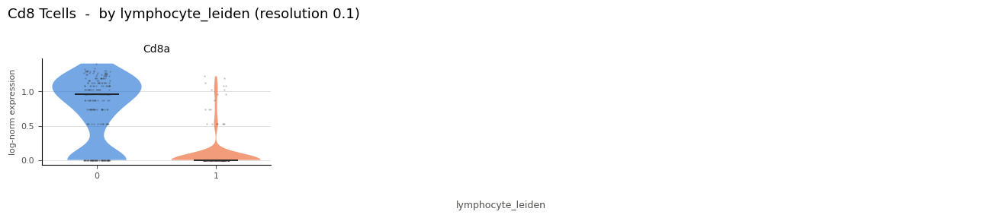

Violin plots written to: /Users/valishashah/Library/CloudStorage/Box-Box/Kaech Lab Folder/Valisha/AD Serial Infection Project  (Irene & Brian W)/Spatial Transcriptomics 20260518/RESULTS/20240627__192310__KAECH_AD_GBM_240627/08_Plaque_Proximity_Analysis/figures/violin_plots


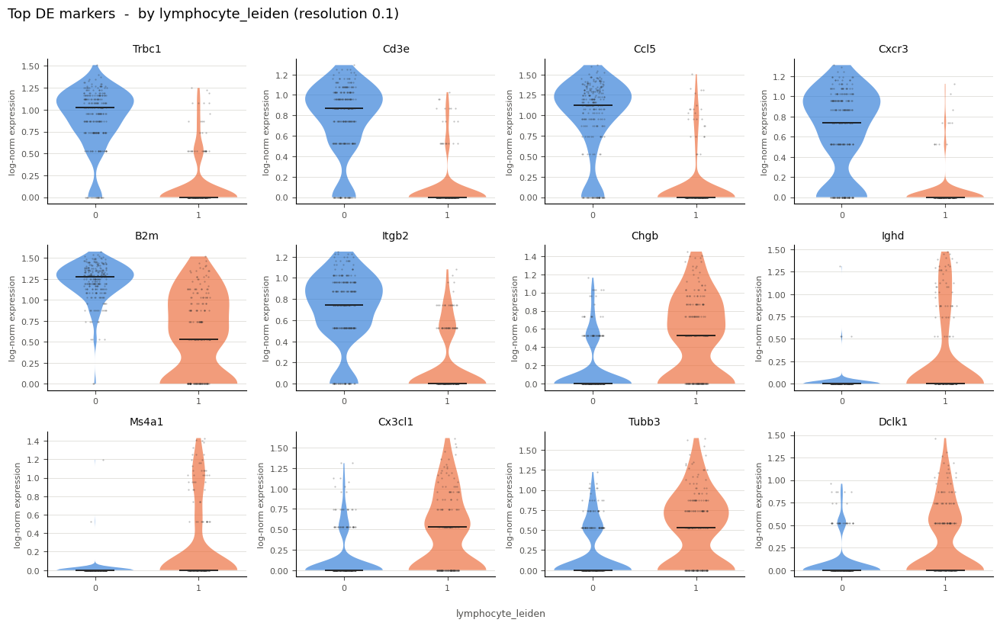

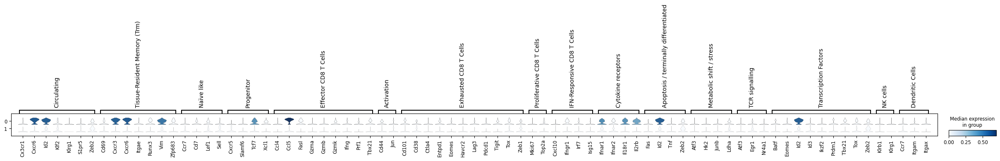

In [22]:
VIOLIN_DIR = FIGURE_DIR / "violin_plots"
VIOLIN_DIR.mkdir(parents=True, exist_ok=True)

cluster_names = lymphocytes.obs[LEIDEN_KEY].cat.categories.tolist()
cluster_colors = list(lymphocytes.uns[f"{LEIDEN_KEY}_colors"])
jitter_rng = np.random.default_rng(0)


def plot_violin_grid(genes, title, output_path, ncols=4):
    """Violins per Leiden cluster, wrapped into a grid.

    sc.pl.violin puts every gene in a single row, which is unreadable past
    about four genes, so the grid is built directly. Expression is the
    log-normalised values in X. The jittered points matter here: these counts
    are sparse enough that a violin over mostly zeros is easy to over-read.
    """
    genes = [gene for gene in genes if gene in lymphocytes.var_names]
    if not genes:
        return None

    nrows = int(np.ceil(len(genes) / ncols))
    fig, axes = plt.subplots(
        nrows, ncols, figsize=(3.3 * ncols, 2.7 * nrows), squeeze=False
    )

    cluster_masks = [
        (lymphocytes.obs[LEIDEN_KEY] == name).to_numpy() for name in cluster_names
    ]

    for index, gene in enumerate(genes):
        ax = axes[index // ncols][index % ncols]
        values = lymphocytes[:, gene].X
        values = np.asarray(values.toarray() if hasattr(values, "toarray") else values).ravel()
        per_cluster = [values[mask] for mask in cluster_masks]

        for position, (cluster_values, color) in enumerate(
            zip(per_cluster, cluster_colors), start=1
        ):
            # violinplot needs some spread; an all-zero cluster gets points only.
            if cluster_values.std() > 0:
                parts = ax.violinplot(
                    cluster_values, positions=[position], widths=0.75,
                    showextrema=False, showmedians=True,
                )
                for body in parts["bodies"]:
                    body.set_facecolor(color)
                    body.set_alpha(0.65)
                    body.set_edgecolor("none")
                parts["cmedians"].set_color("#0b0b0b")
                parts["cmedians"].set_linewidth(1.2)

            jitter = jitter_rng.uniform(-0.11, 0.11, len(cluster_values))
            ax.scatter(
                position + jitter, cluster_values, s=2.5, color="#2b2b2b",
                alpha=0.30, linewidths=0, zorder=3,
            )

        ax.set_xticks(range(1, len(cluster_names) + 1))
        ax.set_xticklabels(cluster_names, fontsize=9)
        ax.set_title(gene, fontsize=10, color="#0b0b0b")
        ax.set_ylabel("log-norm expression", fontsize=8, color="#52514e")
        ax.tick_params(axis="both", labelsize=8, colors="#52514e")
        ax.spines[["top", "right"]].set_visible(False)
        ax.grid(axis="y", color="#e3e2dd", linewidth=0.7)
        ax.set_axisbelow(True)

    for index in range(len(genes), nrows * ncols):
        axes[index // ncols][index % ncols].axis("off")

    fig.suptitle(title, y=1.0, fontsize=13, x=0.01, ha="left")
    fig.supxlabel(LEIDEN_KEY, fontsize=9, color="#52514e")
    plt.tight_layout()
    fig.savefig(output_path, dpi=200, bbox_inches="tight", facecolor="white")
    plt.show()
    return fig


# One grid per phenotype, using the same detection filter as the feature plots.
for phenotype, genes in signature_genes.items():
    plot_genes = [gene for gene in genes if gene in PLOTTED_GENES]
    if not plot_genes:
        continue
    plot_violin_grid(
        plot_genes,
        f"{phenotype}  -  by {LEIDEN_KEY} (resolution {LEIDEN_RESOLUTION})",
        VIOLIN_DIR / f"violin_{safe_filename(phenotype)}.png",
    )

print("Violin plots written to:", VIOLIN_DIR)

# The data-driven markers, independent of the sheet.
top_de_genes = (
    significant_markers.groupby("subcluster", observed=True).head(6)["names"].unique().tolist()
)
plot_violin_grid(
    top_de_genes,
    f"Top DE markers  -  by {LEIDEN_KEY} (resolution {LEIDEN_RESOLUTION})",
    FIGURE_DIR / "violin_top_de_markers.png",
)

# Compact overview of everything at once.
stacked_groups = {
    phenotype: [gene for gene in genes if gene in PLOTTED_GENES]
    for phenotype, genes in SCORED_SIGNATURES.items()
}
stacked_groups = {name: genes for name, genes in stacked_groups.items() if genes}

sc.pl.stacked_violin(
    lymphocytes, var_names=stacked_groups, groupby=LEIDEN_KEY,
    standard_scale="var", cmap="Blues", show=False,
)
plt.savefig(FIGURE_DIR / "stacked_violin_all_signatures.png", dpi=200,
            bbox_inches="tight", facecolor="white")
plt.show()


#### relabel cluster 0

In [27]:
# Cluster 0 of the res-0.1 run is the T-cell cluster (Cd3e 87%, Trbc1 92%).
# Relabel it in manual_celltype; the CD4 cells inside it are corrected below.
TCELL_CLUSTER = "0"
TCELL_LABEL = "T-cells"
# Snapshot the original annotation: after this cell "Lymphocytes" no longer
# marks those 240 cells, so recomputing positions from manual_celltype on a
# re-run would silently give a different, smaller set.
if "manual_celltype_prelabel" not in adata.obs:
    adata.obs["manual_celltype_prelabel"] = adata.obs["manual_celltype"].copy()

lymphocyte_positions = np.flatnonzero(
    (adata.obs["manual_celltype_prelabel"] == "Lymphocytes").to_numpy()
)
assert len(lymphocyte_positions) == lymphocytes.n_obs
assert (adata.obs_names[lymphocyte_positions] == lymphocytes.obs_names).all()

tcell_mask = np.zeros(adata.n_obs, dtype=bool)
tcell_mask[lymphocyte_positions[(lymphocytes.obs[LEIDEN_KEY] == TCELL_CLUSTER).to_numpy()]] = True

adata.obs["manual_celltype"] = adata.obs["manual_celltype"].cat.add_categories(
    [c for c in [TCELL_LABEL] if c not in adata.obs["manual_celltype"].cat.categories]
)
adata.obs.loc[tcell_mask, "manual_celltype"] = TCELL_LABEL

print(f"relabelled {int(tcell_mask.sum())} cells -> {TCELL_LABEL!r}")
print(adata.obs.loc[tcell_mask, "batch"].value_counts().to_string())


relabelled 244 cells -> 'T-cells'
batch
AD_inf     132
AD_mock    112


/opt/anaconda3/envs/scvi_mac/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Leiden resolution 0.2: 2 subclusters


,n_cells,percent_Cd8ab,percent_Cd4,median_transcripts
tcell_leiden,,,,
0,226,80.5,6.6,209.0
1,18,16.7,83.3,183.5


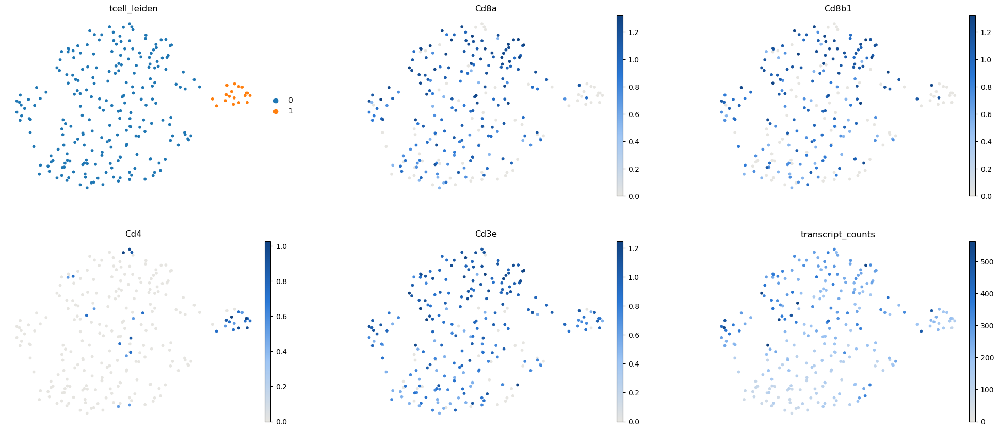

In [28]:
# Repeat PCA -> UMAP -> Leiden inside the T-cell cluster to split CD8 from CD4.
TCELL_RESOLUTION = 0.2
TCELL_KEY = "tcell_leiden"

tcells = lymphocytes[lymphocytes.obs[LEIDEN_KEY] == TCELL_CLUSTER].copy()
tcells.X = tcells.layers["lognorm"].copy()

sc.pp.scale(tcells, max_value=10)
sc.tl.pca(tcells, n_comps=30, svd_solver="arpack", random_state=0)
tcells.X = tcells.layers["lognorm"].copy()          # restore for plotting

sc.pp.neighbors(tcells, n_pcs=30, n_neighbors=10)
sc.tl.umap(tcells, min_dist=0.3, random_state=0)
sc.tl.leiden(tcells, resolution=TCELL_RESOLUTION, key_added=TCELL_KEY,
             flavor="igraph", n_iterations=2, directed=False, random_state=0)

# Marker detection per subcluster: Cd8a/Cd8b1 vs Cd4. With only ~28 Cd4+ cells
# these counts, not the clustering alone, are what the call rests on.
CD8_GENES, CD4_GENES = ["Cd8a", "Cd8b1"], ["Cd4"]
detected = pd.DataFrame(
    (tcells[:, CD8_GENES + CD4_GENES].X.toarray() > 0),
    columns=CD8_GENES + CD4_GENES, index=tcells.obs_names,
)
tcells.obs["cd8_positive"] = detected[CD8_GENES].any(axis=1).to_numpy()
tcells.obs["cd4_positive"] = detected[CD4_GENES].any(axis=1).to_numpy()

subcluster_summary = pd.DataFrame({
    "n_cells": tcells.obs[TCELL_KEY].value_counts().sort_index(),
    "percent_Cd8ab": 100 * tcells.obs.groupby(TCELL_KEY, observed=True)["cd8_positive"].mean(),
    "percent_Cd4": 100 * tcells.obs.groupby(TCELL_KEY, observed=True)["cd4_positive"].mean(),
    "median_transcripts": tcells.obs.groupby(TCELL_KEY, observed=True)["transcript_counts"].median(),
}).round(1)

print(f"Leiden resolution {TCELL_RESOLUTION}: {tcells.obs[TCELL_KEY].nunique()} subclusters")
display(subcluster_summary)

fig = sc.pl.umap(tcells, color=[TCELL_KEY, "Cd8a", "Cd8b1", "Cd4", "Cd3e", "transcript_counts"],
                 ncols=3, frameon=False, size=70, cmap=EXPRESSION_CMAP, vmin=0, vmax="p99",
                 wspace=0.25, return_fig=True)
fig.savefig(FIGURE_DIR / "tcell_umap_cd8_cd4.png", dpi=300, bbox_inches="tight", facecolor="white")
plt.show()


In [31]:
# Explicit labels per subcluster. Check these against percent_Cd8ab /
# percent_Cd4 in subcluster_summary before trusting them.
CD4_LABEL = "Cd4 T-cells"
TCELL_LABEL = "Cd8 T-cells"
SUBCLUSTER_LABELS = {
    "0": TCELL_LABEL,   # Cd8 T-cells
    "1": CD4_LABEL,
}

# Any subcluster left out keeps the CD8 label.
subcluster_call = pd.Series(
    {name: SUBCLUSTER_LABELS.get(name, TCELL_LABEL)
     for name in subcluster_summary.index}
)
subcluster_summary["call"] = subcluster_call
tcells.obs["tcell_subtype"] = pd.Categorical(
    tcells.obs[TCELL_KEY].map(subcluster_call.to_dict())
)

unmapped = [n for n in subcluster_summary.index if n not in SUBCLUSTER_LABELS]
if unmapped:
    print(f"not in SUBCLUSTER_LABELS, defaulted to {TCELL_LABEL!r}: {unmapped}")
display(subcluster_summary)

# Write both labels back onto the combined object.
tcell_positions = lymphocyte_positions[
    (lymphocytes.obs[LEIDEN_KEY] == TCELL_CLUSTER).to_numpy()
]
for label in set(subcluster_call):
    if label not in adata.obs["manual_celltype"].cat.categories:
        adata.obs["manual_celltype"] = adata.obs["manual_celltype"].cat.add_categories([label])
    adata.obs.iloc[
        tcell_positions[(tcells.obs["tcell_subtype"] == label).to_numpy()],
        adata.obs.columns.get_loc("manual_celltype"),
    ] = label

adata.obs["tcell_leiden"] = pd.Categorical(
    pd.Series(tcells.obs[TCELL_KEY].to_numpy(), index=adata.obs_names[tcell_positions])
    .reindex(adata.obs_names)
)
print()
print(adata.obs["manual_celltype"].value_counts().reindex(
    [TCELL_LABEL, CD4_LABEL, "Lymphocytes"]).to_string())


,n_cells,percent_Cd8ab,percent_Cd4,median_transcripts,call
tcell_leiden,,,,,
0,226,80.5,6.6,209.0,Cd8 T-cells
1,18,16.7,83.3,183.5,Cd4 T-cells



manual_celltype
Cd8 T-cells    226
Cd4 T-cells     18
Lymphocytes    185


In [ ]:
sc.tl.rank_genes_groups(tcells, groupby=TCELL_KEY, method="wilcoxon", tie_correct=True)
tcell_markers = sc.get.rank_genes_groups_df(tcells, group=None).rename(columns={"group": "subcluster"})
tcell_markers = tcell_markers.loc[
    (tcell_markers["pvals_adj"] < 0.05) & (tcell_markers["logfoldchanges"] > 0.5)
]
for name in tcells.obs[TCELL_KEY].cat.categories:
    print(f"cluster {name}: " + ", ".join(tcell_markers.loc[tcell_markers.subcluster == name].head(10)["names"]))

TCELL_H5AD = OUTPUT_DIR / f"tcells_pca_leiden_res{TCELL_RESOLUTION}.h5ad"
tcells.write_h5ad(TCELL_H5AD, compression="gzip")
with pd.ExcelWriter(OUTPUT_DIR / "tcell_cd8_cd4_split.xlsx", engine="openpyxl") as writer:
    subcluster_summary.to_excel(writer, sheet_name="subcluster_summary")
    tcell_markers.to_excel(writer, sheet_name="DE_significant", index=False)
print("\nWrote", TCELL_H5AD.name, "and tcell_cd8_cd4_split.xlsx")
